## Importing Libraries and Modules

In [193]:
from os.path import abspath, join, pardir

modules_path = abspath(pardir + "/library")
if modules_path not in sys.path:
    sys.path.append(modules_path)

import functions

import pandas as pd
import numpy as np
import scipy
from datetime import datetime
from math import ceil

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.preprocessing import LabelEncoder,StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, confusion_matrix


In [156]:
functions.list_files(abspath(pardir))

Business Cases for DS - BC2/
    .DS_Store
    bc2_presentation.pptx
    .849C9593-D756-4E56-8D6E-42412F2A707B
    analysis/
    images/
        cancellationbycustomertype.png
        cancellationbydeposit.png
        deposittype_radar.png
        cancellationbychannel.png
    library/
        functions.py
        .DS_Store
        __pycache__/
            functions.cpython-38.pyc
    scripts/
        .DS_Store
        bc2.ipynb
        __pycache__/
            filetree.cpython-38.pyc
        .ipynb_checkpoints/
    .ipynb_checkpoints/
    data/
        H2.csv


## Loading Data

In [157]:
df = pd.read_csv("../data/H2.csv")

## Describing, Assessing and Exploring Data

In [158]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79330 entries, 0 to 79329
Data columns (total 31 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   IsCanceled                   79330 non-null  int64  
 1   LeadTime                     79330 non-null  int64  
 2   ArrivalDateYear              79330 non-null  int64  
 3   ArrivalDateMonth             79330 non-null  object 
 4   ArrivalDateWeekNumber        79330 non-null  int64  
 5   ArrivalDateDayOfMonth        79330 non-null  int64  
 6   StaysInWeekendNights         79330 non-null  int64  
 7   StaysInWeekNights            79330 non-null  int64  
 8   Adults                       79330 non-null  int64  
 9   Children                     79326 non-null  float64
 10  Babies                       79330 non-null  int64  
 11  Meal                         79330 non-null  object 
 12  Country                      79306 non-null  object 
 13  MarketSegment   

In [159]:
#Creating list of numeric and non-numeric features
numeric_features = ["IsCanceled","LeadTime","ArrivalDateYear","ArrivalDateWeekNumber","ArrivalDateDayOfMonth",
    "StaysInWeekendNights","StaysInWeekNights","Adults","Children","Babies","IsRepeatedGuest",
    "PreviousCancellations","PreviousBookingsNotCanceled", "BookingChanges","DaysInWaitingList",
    "ADR","TotalOfSpecialRequests","RequiredCarParkingSpaces"]
    
non_numeric_features = df.columns.drop(numeric_features).to_list()

In [160]:
#Sampling data
df.sample(10)

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,Meal,Country,MarketSegment,DistributionChannel,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,ReservedRoomType,AssignedRoomType,BookingChanges,DepositType,Agent,Company,DaysInWaitingList,CustomerType,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ReservationStatus,ReservationStatusDate
77872,0,155,2017,August,32,7,1,4,2,0.0,0,SC,FRA,Online TA,TA/TO,0,0,0,A,A,1,No Deposit,9,NULL,0,Transient,120.0,0,2,Check-Out,2017-08-12
64610,0,0,2017,January,3,16,1,3,1,0.0,0,BB,GBR,Offline TA/TO,TA/TO,0,0,0,D,D,0,No Deposit,416,NULL,0,Transient,113.0,0,0,Check-Out,2017-01-20
635,0,12,2015,August,32,5,0,3,2,0.0,0,BB,RUS,Corporate,Corporate,0,0,0,A,A,0,No Deposit,NULL,38,0,Transient-Party,65.0,0,0,Check-Out,2015-08-08
72043,0,0,2017,May,20,19,0,1,1,0.0,0,BB,PRT,Aviation,Corporate,0,0,0,A,A,1,No Deposit,153,NULL,0,Group,110.0,0,0,Check-Out,2017-05-20
27480,1,143,2017,May,18,4,0,3,2,0.0,0,BB,PRT,Groups,TA/TO,0,0,0,A,A,0,Non Refund,151,NULL,0,Transient,100.0,0,0,Canceled,2016-12-12
49655,0,43,2016,May,21,21,2,2,2,0.0,0,BB,BRA,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9,NULL,0,Transient,140.4,0,1,Check-Out,2016-05-25
75581,0,178,2017,July,27,6,0,3,2,0.0,0,SC,PRT,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,9,NULL,0,Transient,89.1,0,2,Check-Out,2017-07-09
19243,1,267,2016,October,44,26,0,3,3,0.0,0,BB,ITA,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9,NULL,0,Transient,128.7,0,1,Canceled,2016-07-22
38991,0,5,2015,October,43,19,1,1,1,0.0,0,BB,CZE,Corporate,Direct,0,0,0,A,A,0,No Deposit,NULL,115,0,Transient,80.0,0,0,Check-Out,2015-10-21
19242,1,2,2016,October,44,26,0,2,1,0.0,0,BB,PRT,Direct,Direct,0,0,0,A,A,1,No Deposit,NULL,NULL,0,Transient,130.0,0,0,Canceled,2016-10-25


In [161]:
#Descriptive analysis of numeric_features variables
describe_numeric_features = df[numeric_features].describe()

#Adding dtypes
describe_numeric_features.loc["dtype"] = df[numeric_features].dtypes

#Adding size
describe_numeric_features.loc["size"] = len(df[numeric_features])

#Adding NaN count
describe_numeric_features.loc['na_count'] = df[numeric_features].isna().sum()
describe_numeric_features = describe_numeric_features.T.style.background_gradient(subset=["std", "na_count"])
describe_numeric_features

,count,mean,std,min,25%,50%,75%,max,dtype,size,na_count
IsCanceled,79330.000000,0.417270,0.493111,0.000000,0.000000,0.000000,1.000000,1.000000,int64,79330,0
LeadTime,79330.000000,109.735724,110.948526,0.000000,23.000000,74.000000,163.000000,629.000000,int64,79330,0
ArrivalDateYear,79330.000000,2016.174285,0.699181,2015.000000,2016.000000,2016.000000,2017.000000,2017.000000,int64,79330,0
ArrivalDateWeekNumber,79330.000000,27.177449,13.398523,1.000000,17.000000,27.000000,38.000000,53.000000,int64,79330,0
ArrivalDateDayOfMonth,79330.000000,15.786625,8.728451,1.000000,8.000000,16.000000,23.000000,31.000000,int64,79330,0
StaysInWeekendNights,79330.000000,0.795185,0.885026,0.000000,0.000000,1.000000,2.000000,16.000000,int64,79330,0
StaysInWeekNights,79330.000000,2.182957,1.456416,0.000000,1.000000,2.000000,3.000000,41.000000,int64,79330,0
Adults,79330.000000,1.850977,0.509292,0.000000,2.000000,2.000000,2.000000,4.000000,int64,79330,0
Children,79326.000000,0.091370,0.372177,0.000000,0.000000,0.000000,0.000000,3.000000,float64,79330,4
Babies,79330.000000,0.004941,0.084323,0.000000,0.000000,0.000000,0.000000,10.000000,int64,79330,0


In [162]:
#Descriptive analysis of non_numeric_features variables
describe_non_numeric_features = df[non_numeric_features].describe()

#Adding unique values
describe_non_numeric_features.loc["unique"] = df[non_numeric_features].nunique()

#Adding dtypes
describe_non_numeric_features.loc["dtype"] = df[non_numeric_features].dtypes

#Adding size
describe_non_numeric_features.loc["size"] = len(df[non_numeric_features])

#Adding NaN count
describe_non_numeric_features.loc['na_count'] = df[non_numeric_features].isna().sum()
describe_non_numeric_features = describe_non_numeric_features.T.style.background_gradient(subset=["na_count"])
describe_non_numeric_features

,count,unique,top,freq,dtype,size,na_count
ArrivalDateMonth,79330,12,August,8983,object,79330,0
Meal,79330,4,BB,62305,object,79330,0
Country,79306,166,PRT,30960,object,79330,24
MarketSegment,79330,8,Online TA,38748,object,79330,0
DistributionChannel,79330,5,TA/TO,68945,object,79330,0
ReservedRoomType,79330,8,A,62595,object,79330,0
AssignedRoomType,79330,9,A,57007,object,79330,0
DepositType,79330,3,No Deposit,66442,object,79330,0
Agent,79330,224,9,31955,object,79330,0
Company,79330,208,NULL,75641,object,79330,0


In [163]:
import plotly.express as px
fig = px.box(df,x = ["LeadTime","ADR"], title = "Outlier Analysis")
fig.show()

In [164]:
fig = px.bar(
    data_frame=df.groupby(["DistributionChannel"], as_index=False).sum(),
    x="DistributionChannel",
    y="IsCanceled",
    #color="ReservationStatus",
    barmode="group",
    title="Cancellation by Distribution Channel"
)

fig.show()

In [165]:
fig = px.bar(
    data_frame=df.groupby(["DepositType"], as_index=False).sum(),
    x="DepositType",
    y="IsCanceled",
    #color="ReservationStatus",
    barmode="group",
    title="Cancellation by Deposit Type"
)

fig.show()

In [166]:
fig = px.bar(
    data_frame=df.groupby(['CustomerType', 'ReservationStatus'], as_index=False).sum(),
    x="CustomerType",
    y="IsCanceled",
    color="ReservationStatus",
    barmode="group",
    title="Cancellation by CustomerType and ReservationStatus"
)

fig.show()

In [167]:
fig = px.bar(
    data_frame=df.groupby(["Meal"], as_index=False).sum(),
    x="Meal",
    y="IsCanceled",
    #color="ReservationStatus",
    barmode="group",
    title="Cancellation by Meal"
)

fig.show()

<AxesSubplot:xlabel='CustomerType', ylabel='count'>

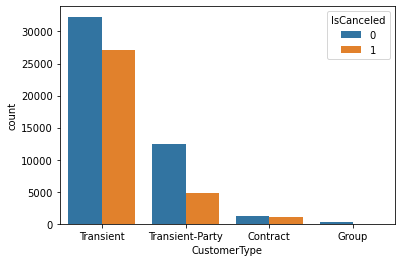

In [168]:
#Cancellation by CustomerType year round
sns.countplot(data=df, x='CustomerType', hue='IsCanceled')

In [169]:
functions.radar_grapher(df.groupby("CustomerType").mean(), needs_scaling=True, name= "CustomerType")

<AxesSubplot:xlabel='DepositType', ylabel='count'>

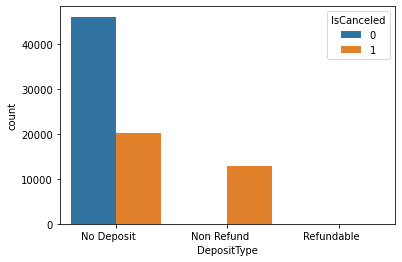

In [170]:
#Cancellation by DepositType
sns.countplot(data=df, x='DepositType', hue='IsCanceled')

In [171]:
df["DepositType"].value_counts()

No Deposit         66442
Non Refund         12868
Refundable            20
Name: DepositType, dtype: int64

In [172]:
functions.radar_grapher(df.groupby("DepositType").mean(), needs_scaling=True, name= "DepositType")

<AxesSubplot:xlabel='DistributionChannel', ylabel='count'>

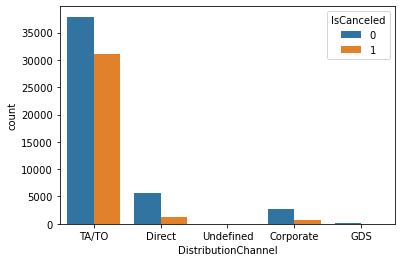

In [173]:
#Cancellation by DistributionChannel
sns.countplot(data=df, x='DistributionChannel', hue='IsCanceled')

In [174]:
functions.radar_grapher(df.groupby("DistributionChannel").mean(), needs_scaling=True, name= "DistributionChannel")

<AxesSubplot:xlabel='Meal', ylabel='count'>

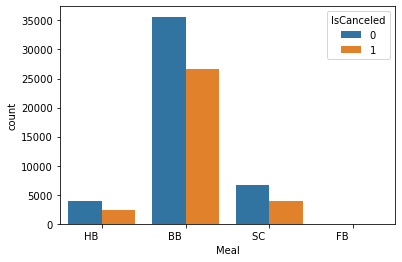

In [175]:
#Cancellation by Meal
sns.countplot(data=df, x='Meal', hue='IsCanceled')

In [176]:
functions.radar_grapher(df.groupby("Meal").mean(), needs_scaling=True, name= "Meal")

In [177]:
pd.DataFrame(np.tril(df[numeric_features].corr()),columns =list(df[numeric_features]), index=list(df[numeric_features])).style.background_gradient(cmap='PuBu')

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,TotalOfSpecialRequests,RequiredCarParkingSpaces
IsCanceled,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
LeadTime,0.309242,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ArrivalDateYear,-0.003004,0.027876,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ArrivalDateWeekNumber,0.001580,0.130392,-0.543027,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ArrivalDateDayOfMonth,-0.004331,0.014502,-0.002910,0.061681,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
StaysInWeekendNights,-0.007343,-0.023913,0.034851,-0.001043,0.000304,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
StaysInWeekNights,0.048704,0.058361,0.066234,-0.008598,-0.011713,0.219601,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Adults,0.053054,0.115792,0.067558,0.006947,-0.001357,0.082130,0.088253,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Children,-0.027075,-0.053567,0.055538,-0.001217,0.012826,0.037525,0.037118,-0.005835,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Babies,-0.030186,-0.030333,-0.008407,0.005450,0.000354,0.006467,0.005469,0.012157,0.023773,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


### Observations

<li>The data is not too dirty, however there are a few missing values as well as an unidentified Distribution Channel.
<li>The LeadTime feature had a noticeable std, which needs to be taken into account, as well as some outliers.
<ls>ADR has an extreme outlier.
<li>It isn't perfectly clear what ADR is.
<li>Grouping the data by features that we would expect to see disparities in cancellations proves to indeed show disparities however, these differences in cancellation may only be absolute and not significant relative to the number of clients within those categories i.e. The majority of our cancellations are from Transient customers but those also make up the vast majority of our customers. More will be done on this in the feature engineer section of our project.
<li>Some of the no-shows (1.9%) lost their deposits which in this case represented the full cost of the stay.
<li> Merge the dates to datetime
<li>Create season feature
<li> Assigned Room and Reserved Room are not always the same. Should create another feature to capture this.
<li> ReservationStatusDate can be used to see when the client cancelled stay

### Data Preparation and Cleaning

In [178]:
#Dropping missing values
df = df.dropna()

#Removing undefined from Distribution Channel
df = df.loc[df["DistributionChannel"] != "Undefined"] 

#Remove outliers from df
#Z-scores for ADR
z_scores_ADR = scipy.stats.zscore(df["ADR"])
abs_z_scores_ADR = np.abs(z_scores_ADR)

#Z-scores for "LeadTime"
z_scores_LeadTime = scipy.stats.zscore(df["LeadTime"])
abs_z_scores_LeadTime = np.abs(z_scores_LeadTime)

#Filtering df
filtered_entries = ((abs_z_scores_ADR < 2) & (abs_z_scores_LeadTime < 2))
df = df[filtered_entries]


In [179]:
#Visualising features after outlier removal 
fig = px.box(df,x = ["LeadTime","ADR"], title = "Features After Outlier Removal")
fig.show()

In [180]:
#Handling dates to datetime in order to feature engineer with them later
df["ArrivalDate"] = df["ArrivalDateYear"].astype(str) + "-" + df["ArrivalDateMonth"].astype(str) + "-" + df["ArrivalDateDayOfMonth"].astype(str)

df["ArrivalDate"] = functions.datetime_converter(df["ArrivalDate"], "%Y-%b-%-w")

df["ReservationStatusDate"] = functions.datetime_converter(df["ReservationStatusDate"],"%Y-%b-%-w")

In [181]:
#Mapping month to int for use later in models

month_map = {'January':'01', 'February':'02', 'March':'03', 'April':'04', 'May':'05', 'June':'06', 'July':'07', 'August':'08', 'September':'09', 'October':'10', 'November':'11', 'December':'12'}
df["ArrivalDateMonth"] = df["ArrivalDateMonth"].map(month_map).astype(int)

In [182]:
#Changing df["Children"] to type int
df["Children"] = df["Children"].astype(int)

## Feature Engineering

In [183]:
#Creating a variable to see if there was a change in room
df['ChangeInRoom'] = df.apply(functions.roomChange, axis=1)

In [184]:
#Creating an aggregation feature for all dependants
df["Dependants"] = (df["Children"] + df["Babies"]).astype(int)

In [185]:
#Feature for total number of previous bookings
df["TotalBookings"] = df["PreviousBookingsNotCanceled"] + df["PreviousCancellations"]

In [186]:
#Creating StayDuration Feature based on ReservationStatusDate
df['StayDuration'] = df['ReservationStatusDate'] - df['ArrivalDate']
df['StayDuration'] = df['StayDuration'] / np.timedelta64(1, 'D')
df['StayDuration'] = df['StayDuration'].astype(int)

#This is not a perfect measure so any ReservationStatusDate before checkin gets set to -1
df.loc[df["StayDuration"] < 0, "StayDuration"] = -1

#NOTE: Should also consider creating a days from cancellation date to supposed arrivaldate

In [187]:
#Label Encoding categorical variables
lb = LabelEncoder()
var = ['Company',"Agent",'CustomerType', 'DepositType', 'MarketSegment', 'DistributionChannel', 'Country']
for item in var:
    df[item] = lb.fit_transform(df[item])

#Getting dummies for categorical variables
df = pd.get_dummies(df, columns=['Company',"Agent", 'CustomerType', 'DepositType', 'MarketSegment', 'DistributionChannel',"Country"])

In [188]:
#Dropping Unnecessary Variables
df.drop(["ArrivalDate","Meal","AssignedRoomType","ReservedRoomType","AssignedRoomType","ReservationStatus","ReservationStatusDate"], axis = 1, inplace=True)

In [189]:
pd.set_option('display.max_columns', None)
df.sample(10)

,IsCanceled,LeadTime,ArrivalDateYear,ArrivalDateMonth,ArrivalDateWeekNumber,ArrivalDateDayOfMonth,StaysInWeekendNights,StaysInWeekNights,Adults,Children,Babies,IsRepeatedGuest,PreviousCancellations,PreviousBookingsNotCanceled,BookingChanges,DaysInWaitingList,ADR,RequiredCarParkingSpaces,TotalOfSpecialRequests,ChangeInRoom,Dependants,TotalBookings,StayDuration,Company_0,Company_1,Company_2,Company_3,Company_4,Company_5,Company_6,Company_7,Company_8,Company_9,Company_10,Company_11,Company_12,Company_13,Company_14,Company_15,Company_16,Company_17,Company_18,Company_19,Company_20,Company_21,Company_22,Company_23,Company_24,Company_25,Company_26,Company_27,Company_28,Company_29,Company_30,Company_31,Company_32,Company_33,Company_34,Company_35,Company_36,Company_37,Company_38,Company_39,Company_40,Company_41,Company_42,Company_43,Company_44,Company_45,Company_46,Company_47,Company_48,Company_49,Company_50,Company_51,Company_52,Company_53,Company_54,Company_55,Company_56,Company_57,Company_58,Company_59,Company_60,Company_61,Company_62,Company_63,Company_64,Company_65,Company_66,Company_67,Company_68,Company_69,Company_70,Company_71,Company_72,Company_73,Company_74,Company_75,Company_76,Company_77,Company_78,Company_79,Company_80,Company_81,Company_82,Company_83,Company_84,Company_85,Company_86,Company_87,Company_88,Company_89,Company_90,Company_91,Company_92,Company_93,Company_94,Company_95,Company_96,Company_97,Company_98,Company_99,Company_100,Company_101,Company_102,Company_103,Company_104,Company_105,Company_106,Company_107,Company_108,Company_109,Company_110,Company_111,Company_112,Company_113,Company_114,Company_115,Company_116,Company_117,Company_118,Company_119,Company_120,Company_121,Company_122,Company_123,Company_124,Company_125,Company_126,Company_127,Company_128,Company_129,Company_130,Company_131,Company_132,Company_133,Company_134,Company_135,Company_136,Company_137,Company_138,Company_139,Company_140,Company_141,Company_142,Company_143,Company_144,Company_145,Company_146,Company_147,Company_148,Company_149,Company_150,Company_151,Company_152,Company_153,Company_154,Company_155,Company_156,Company_157,Company_158,Company_159,Company_160,Company_161,Company_162,Company_163,Company_164,Company_165,Company_166,Company_167,Company_168,Company_169,Company_170,Company_171,Company_172,Company_173,Company_174,Company_175,Company_176,Company_177,Company_178,Company_179,Company_180,Company_181,Company_182,Company_183,Company_184,Company_185,Company_186,Company_187,Company_188,Company_189,Company_190,Company_191,Company_192,Company_193,Company_194,Company_195,Company_196,Company_197,Agent_0,Agent_1,Agent_2,Agent_3,Agent_4,Agent_5,Agent_6,Agent_7,Agent_8,Agent_9,Agent_10,Agent_11,Agent_12,Agent_13,Agent_14,Agent_15,Agent_16,Agent_17,Agent_18,Agent_19,Agent_20,Agent_21,Agent_22,Agent_23,Agent_24,Agent_25,Agent_26,Agent_27,Agent_28,Agent_29,Agent_30,Agent_31,Agent_32,Agent_33,Agent_34,Agent_35,Agent_36,Agent_37,Agent_38,Agent_39,Agent_40,Agent_41,Agent_42,Agent_43,Agent_44,Agent_45,Agent_46,Agent_47,Agent_48,Agent_49,Agent_50,Agent_51,Agent_52,Agent_53,Agent_54,Agent_55,Agent_56,Agent_57,Agent_58,Agent_59,Agent_60,Agent_61,Agent_62,Agent_63,Agent_64,Agent_65,Agent_66,Agent_67,Agent_68,Agent_69,Agent_70,Agent_71,Agent_72,Agent_73,Agent_74,Agent_75,Agent_76,Agent_77,Agent_78,Agent_79,Agent_80,Agent_81,Agent_82,Agent_83,Agent_84,Agent_85,Agent_86,Agent_87,Agent_88,Agent_89,Agent_90,Agent_91,Agent_92,Agent_93,Agent_94,Agent_95,Agent_96,Agent_97,Agent_98,Agent_99,Agent_100,Agent_101,Agent_102,Agent_103,Agent_104,Agent_105,Agent_106,Agent_107,Agent_108,Agent_109,Agent_110,Agent_111,Agent_112,Agent_113,Agent_114,Agent_115,Agent_116,Agent_117,Agent_118,Agent_119,Agent_120,Agent_121,Agent_122,Agent_123,Agent_124,Agent_125,Agent_126,Agent_127,Agent_128,Agent_129,Agent_130,Agent_131,Agent_132,Agent_133,Agent_134,Agent_135,Agent_136,Agent_137,Agent_138,Agent_139,Agent_140,Agent_141,Agent_142,Agent_143,Agent_144,Agent_145,Agent_146,Agent_147,Ag

## Modelling

In [190]:
X = df.drop("IsCanceled", axis = 1)
y = df["IsCanceled"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [191]:
#Scaling data
X_train_scaled = functions.scaler_function(X_train)
X_test_scaled = functions.scaler_function(X_test)

In [207]:
#Logistic Regression
logreg = LogisticRegression(max_iter=500).fit(X_train_scaled, y_train)
scores = cross_val_score(logreg, X_train_scaled, y_train, cv=5)
logreg_pred = logreg.predict(X_test_scaled)

print("Average cross validation score: {:.3f}".format(scores.mean()))
print("Test accuracy: {:.3f}".format(logreg.score(X_test_scaled, y_test)))
print("F1 score: {:.3f}".format(f1_score(y_test, logreg_pred)))
print(confusion_matrix(y_test, logreg_pred))

Average cross validation score: 1.000
Test accuracy: 1.000
F1 score: 1.000
[[8471    0]
 [   2 5829]]
